In [32]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import scipy as sp
import csv
import matplotlib.patches as mpatches
import pylab as pb
import pandas as pd
import lmfit
import matplotlib.ticker as mtick
from IPython.display import Image

# <center> JFET Theory </center>

_______

* The JFET cannot be biased beyond or even close to the flat-band condition, $V_{\mathrm{fb}}$, before excessive current flows through the gate (enacted here by the _p-n_ junction). <br/><br/>

* Advantages over MOSFETs include: reduced scattering from oxide interfaces, no [hot-electron injection](https://en.wikipedia.org/wiki/Hot-carrier_injection) and reliability due to trapping.<br/><br/>

* _p-n_ junction usually needs diffusion or implant-anneal sequence. The advantage of the van der Waals approach is to bypass these steps entirely. <br/><br/>

* Metal gate defines short channels for high-frequency operation more precisely in MOSFETs. However, JFETs are more robust to higher breakdown voltages and better for power consumption (good point to use 2D vdW materials for JFETs).<br/><br/>

* JFET lends itself towards _enhancement mode_ devices due to its higher built-in potential. Less gate leakage than in a MESFET as well, as the _p-n_ junction is more well-controlled than the Schottky barrier in a MESFET.<br/><br/>

* Channel length, $L$, and _gate length_ are interchangeable terms for a JFET. Other useful variables are: $a$–channel depth, $W_D$–depletion layer width and $b$–net channel opening.

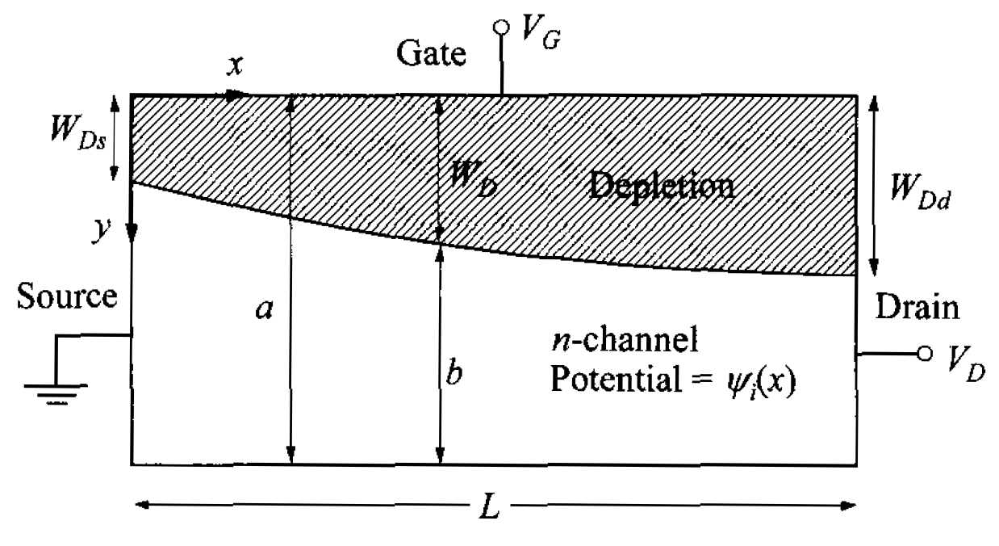

In [72]:
Image(filename = "img/cc.PNG", width = 500)

* Source electrode is **grounded** $\therefore V_g$ and $V_D$ are measured with respect to it.<br/><br/>

* When $V_g = V_D$ = 0 V, the device is in equilibrium and we have no current flow. Most JFETs are **normally-on**, _i.e._ conduct current at $V_g$ = 0 V. If considering back-gating at the same time, we can simply half the resultant transconductance, $g_m$, and the final $I_D$.<br/><br/>

* The JFET output characteristics:

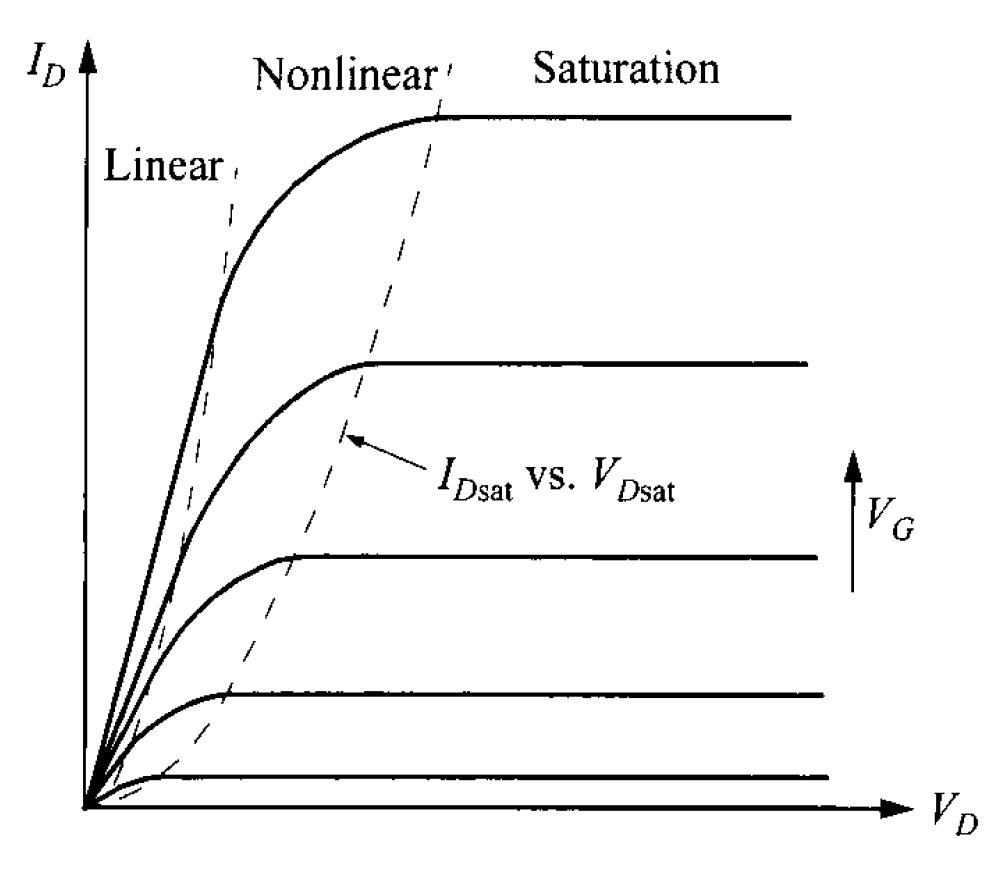

In [74]:
Image(filename = "img/dd.PNG", width = 400)

* $\Large \frac{d E_y}{d y} = - \frac{d^2 \Delta \Psi_i}{d y^2} = \frac{q N_D}{\varepsilon_s}$<br/><br/>

* $W_D(x) = \sqrt{\Large \frac{2 \varepsilon_s \left [ \Psi_{bi} + \Delta \Psi_i(x) - V_g \right ]}{q N_D}}$ where for a _p-n_ junction:<br/><br/>$\Psi_{bi} \approx \large \frac{1}{q} \left [ E_g - k T \mathrm{ln} \left ( \frac{N_C}{N_D} \right ) \right ]$<br/><br/>

* $\Delta \Psi_i(x) = \frac{-E_i(x)}{q}$ ; $\Delta \Psi_i(L) = V_D$<br/><br/>

* $W^{\mathrm{source}}_{D} = W_D(0) = \sqrt{\large \frac{2 \varepsilon_s (\Psi_{bi} - V_g)}{q N_D}}$<br/><br/>$W^{\mathrm{drain}}_{D} = W_D(L) = \sqrt{\large \frac{2 \varepsilon_s (\Psi_{bi} + V_D - V_g)}{q N_D}}$<br/><br/>

* Flat-band condition of $V_g = \Psi_{bi}$ corresponds to $W^{\mathrm{source}}_{D} = 0$. This is unachievable due to gate leakage from excessive forward bias current across the _p-n_ junction.<br/><br/>

* Maximum value of $W^{\mathrm{drain}}_{D} = a$. At pinch-off potential: $\Psi_P = \large \frac{q N_D a^2}{2 \varepsilon}$<br/><br/>

* Charge in the channel: $Q_n(x) = q N_D(a - W_D)$ ; so current in the channel: $I_D(x) = Z Q_n(x)v(x)$, where $v(x)$ is the carrier velocity.<br/><br/>

* $I_D = \large \frac{Z}{L} \displaystyle \int^L_0 Q_n(x) v(x) d x$ as $I_D$ must be independent of channel length, $L$.<br/><br/>

* $v$ may saturate due to high electric field _before_ it saturates due to channel pinch-off.<br/><br/>

* $v = \mu E$ if $\mu$ is constant. $E_x = \large \frac{d \Delta \Psi_i}{d x}$<br/><br/>

* The integral for current will then be: $\large \frac{Z q \mu N_D}{L} \displaystyle \int^{V_D}_{0} \left [ a - \sqrt{\frac{2 \varepsilon_s (\Psi_{bi} + \Delta \Psi_i - V_g)}{q N_D}}\right ] d \Delta \Psi_i = \\ \large G_i \left \{ V_D - \frac{2}{3 \sqrt{\Psi_P}} \left [ (\Psi_{bi} + V_D - V_g)^{3/2} - (\Psi_{bi} - V_g)^{3/2}\right ]  \right \}$<br/><br/>where $G_i = \large \frac{Z q \mu N_D a}{L}$ is the full channel conductance at $W_D$ = 0.<br/><br/>

* In the linear region, $V_D << V_g$ and $V_D << \Psi_{bi} \therefore I^{\mathrm{linear}}_{D} = G_i \left (1 - \sqrt{\frac{\Psi_{bi} - V_g}{\Psi_P}} \right ) V_D$. So when $V_g \approx V_{th} = \Psi_{bi} - \Psi_P$:<br/><br/>
<center>$\boxed{\large I^{\mathrm{linear}}_{D} = \frac{G_i}{2 \Psi_P} (V_g - V_{th}) V_D}$</center>

* Pinch-off begins at $V^{\mathrm{sat}}_{D} = V_g - V_{th}$: $I^{\mathrm{sat}}_{D} = \large G_i \left [ \frac{\psi_P}{3} - (\Psi_{bi} - V_g) \left ( 1 - \frac{2}{3} \sqrt{\frac{\Psi_{bi} - V_g}{\Psi_P}}\right ) \right ]$<br/><br/> and $g_m = \large \frac{\partial I^{\mathrm{sat}}_{D}}{\partial V_g} = G_i \left( 1 - \sqrt{\frac{\Psi_{bi} - V_g}{\Psi_P}} \right) \therefore$<br/><br/> <center>$\boxed{\large I^{\mathrm{sat}}_{D} \approx \large \frac{G_i}{4 \Psi_P} (V_g - V_{th})^2}$</center>

# <center> Mixed-Dimensional JFET-related Papers </center>

_______

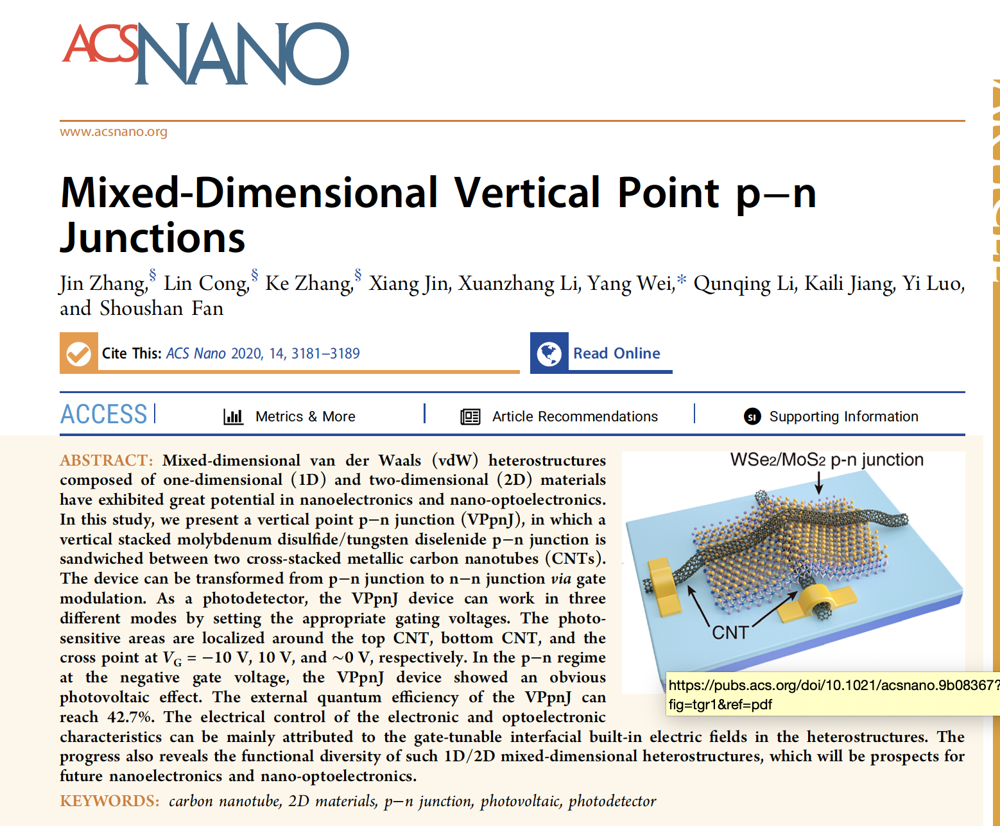

In [33]:
Image(filename = "img/a.PNG", width = 600)

* Metallic CNTs used as 1D electrodes to confine contact area over planar _p-n_ junction.<br/><br/>

* MoS$_2$ thickness = 14 nm, WSe$_2$ thickness = 16 nm.<br/><br/>

* CNT diameters are 1.4 nm and 1.3 nm.<br/><br/>

* Contact stack $\rightarrow$ Ti/Au (5 nm/60 nm). Vacuum-annealed at 350$^{\circ}$C for 1 hr after EBL to improve contact. <br/><br/>

* n$^{\mathrm{MoS_2}}_{\mathrm{2D}}$ = **1.3 $\cdot$ 10$^{12}$ cm$^{-2}$**; n$^{\mathrm{WSe_2}}_{\mathrm{2D}}$ = **4 $\cdot$ 10$^{11}$ cm$^{-2}$** @ V$_g$ = 0 V.<br/><br/>

* Back-gating through 50 nm of SiO$_2$ allows for tuning the band alignement of the heterostructure, leading to rectifying behaviour at V$_g$ < 0 V when the underlying WSe$_2$ gets further _p_-doped and more symmetric _I-V_ characteristics at V$_g$ > 0 V when the contact between the MoS$_2$ and the top CNT improves due to _n_-doping.<br/><br/>

* Photodetector has $\mu$s-scale response times.

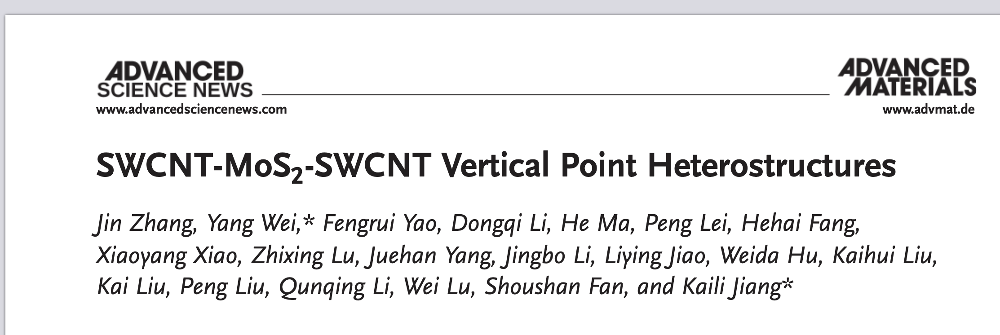

In [24]:
Image(filename = "img/b.PNG", width = 600)

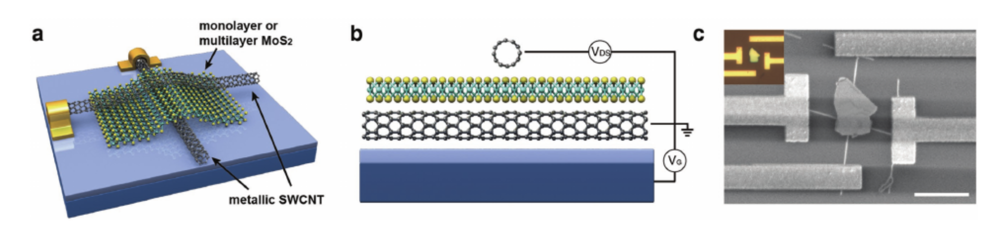

In [25]:
Image(filename = "img/c.PNG", width = 600)

* (same group as above). <br/><br/>

* Metallic CNT used to gate MoS$_2$ only. _p_-type CNT used to make vertical _p-n_ junction with the moly (39 nm in thickness).<br/><br/>

* Conduction is through CNTs, MoS$_2$ is being used only as an interface for making the _p-n_ junction. <br/><br/>

* Similar work from the same group in `Advanced Materials` [here](https://onlinelibrary.wiley.com/doi/epdf/10.1002/adma.201702942).<br/><br/>

* A. Javey group paper on zirconia-buried CNT gate underneath MoS$_2$ in `Science` [here](https://science.sciencemag.org/content/sci/354/6308/99.full.pdf).

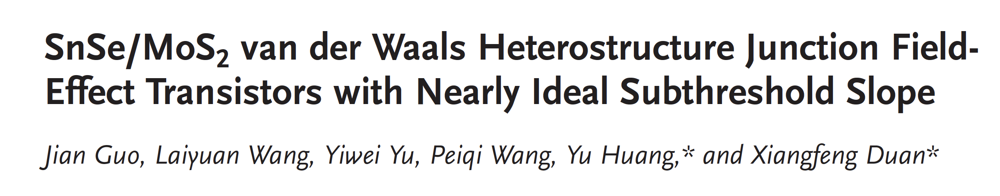

In [26]:
Image(filename = "img/d.PNG", width = 600)

* 2D/2D JFET 2019 paper in `Advanced Materials` from X. Duan Group. <br/><br/>

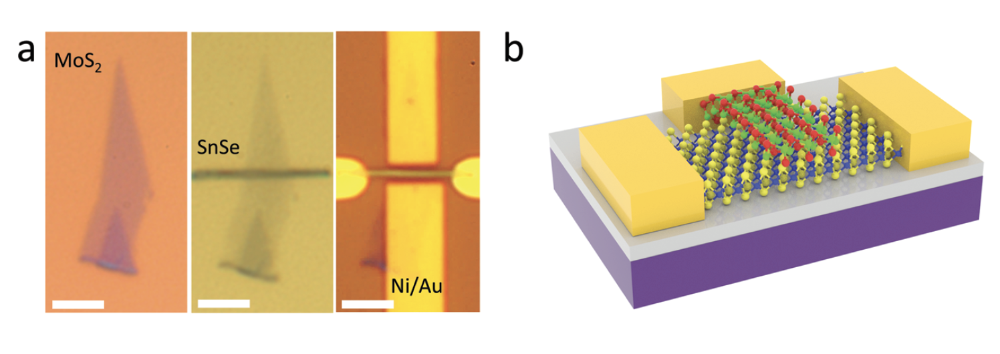

In [27]:
Image(filename = "img/e.PNG", width = 600)

* Sold as low $SS$ @ 60.3 mV dec$^{-1}$. Pinch-off at V$_p$ = -0.25 V. ON/OFF ratio: $\sim$ 10$^6$.<br/><br/>

* Reverse current, _i.e._ gate leakage is in the pA range.<br/><br/>

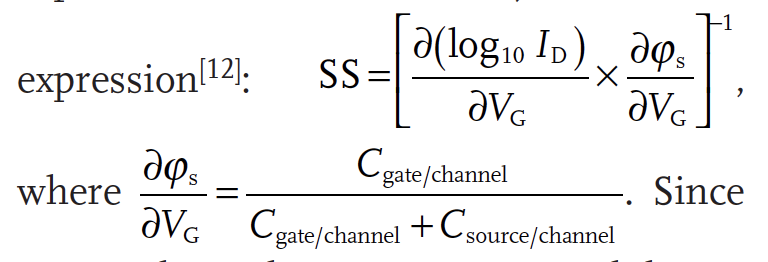

In [28]:
Image(filename = "img/f.PNG", width = 600)

* C$_{\mathrm{source/channel}}$ is minimized due to small thickness, minimizing $SS$ accordingly, as well as V$_p$.<br/><br/>

* MoS$_2$ thickness is about 10 layers.<br/><br/>

* Applying negative gate to SnSe depletes the MoS$_2$ channel underneath of carriers, bending its bands up accordingly.<br/><br/>

* Gate sweep rate used was 50 mV/s, showing a small hysteresis of $\approx$ 6 mV.<br/><br/>

* $\Large I_{ds} = I_{dss} \left( 1 - \frac{V_{gs}}{V_p} \right)^2$ describes the output characteristics of the JFET.<br/><br/>

* $I_{dss}$ @ V$_g$ = 0 V is $\approx$ 0.6 $\mu$A $\mu$m$^{-1}$.<br/><br/>

* $\Large \mu = \frac{L G_{\mathrm{max}}}{W t q N_D}$ where $\large N_D = \frac{-H I}{q V_H t}$, $G_{\mathrm{max}}$ is the maximum transconductance, $H$ is the magnetic field and $V_H$ is the Hall voltage.<br/><br/>

* $\mu \approx$ 27 cm$^2$ V$^{-1}$ s$^{-1}$ in this work.<br/><br/>

* Pinch-off occurs at drain side of the channel when $V_{ds} > V_{gs} - V_p$.<br/><br/>

* $SS$ should be **independent** of channel length.<br/><br/>

* Channel beyond Debye length remains conductive, so the MoS$_2$ may not be too thick, otherwise conduction will not be fully pinched off by the formed depletion layer.<br/><br/>

* $\Large \frac{\Psi_G}{\Psi_{\mathrm{channel}}} \approx \frac{N_D}{N_G}$ where $\Psi$ are potential drops and $N$ are the doping concentrations in the channel and gate.<br/><br/>

* In principle, any variation in the gate potential should be transferred fully to the channel. Thus, doping of the gate layer should be much higher to account for any electrostatic losses during gating.<br/><br/>

* The gate must also be thicker than the channel to ensure it doesn't fully deplete thereby lowering control over the channel.<br/><br/>

* Back-gating the MoS$_2$ underneath increases output current due to higher conductivity, but $SS$ and $V_p$ shift and the current in the OFF state is higher.<br/><br/>

* $\Large V_{th} = V_p = - \frac{q t^2 N_D}{8 \varepsilon_{\mathrm{MoS_2}}}$<br/><br/>

* $\large V_{th}$ shifts with increasing temperature, while the mobility drops due to phonon contributions to scattering.<br/><br/>

* On the plot of $\large \sqrt{I_{ds}}$ _vs_ $\large V_{\mathrm{gs}}$, the intercept to the _x_-axis gives $V_p$.

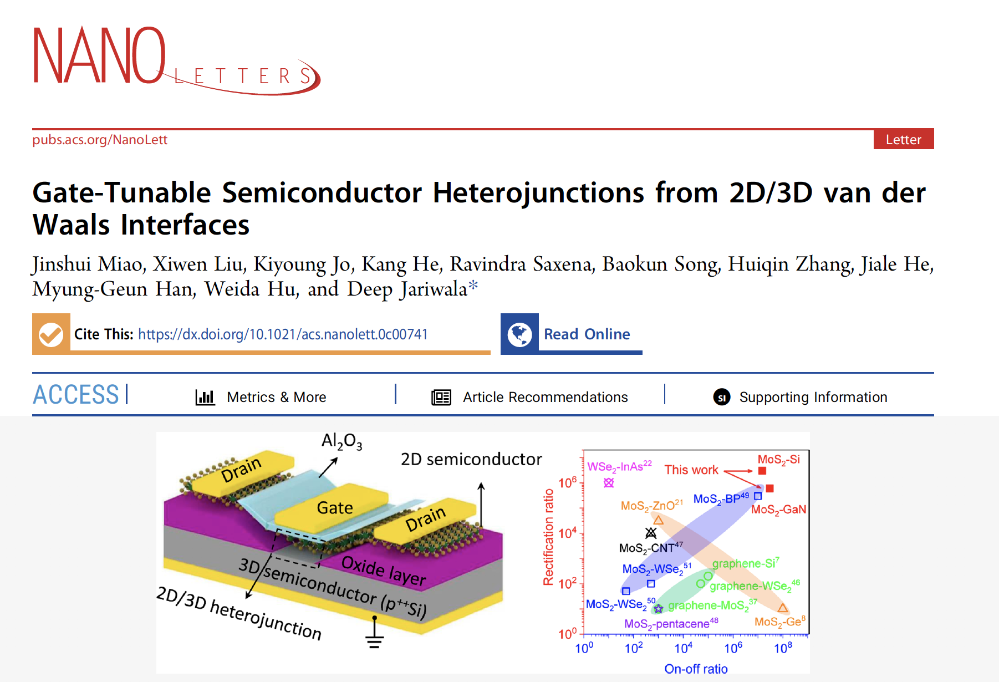

In [35]:
Image(filename = "img/g.PNG", width = 600)

* Mixed-dimensional heterojunction diode fabricated by transferring 2D moly onto exposed 3D Si substrate.<br/><br/>

* The source electrode is the grounded $p^{++}$-Si substrate. Two drain electrodes are on either side of the etched oxide recess and the gate electrode is on top of 30 nm of ALD Al$_2$O$_3$.<br/><br/>

* Simulations of this _type-II_ heterojunction suggest that the depletion width extends the entire thickness of the MoS$_2$ in the overlap region.<br/><br/>

* Rectifying _I-V_ transport at negative gates, slowly transitioning to symmetric ouput characteristics at positive $V_g$.

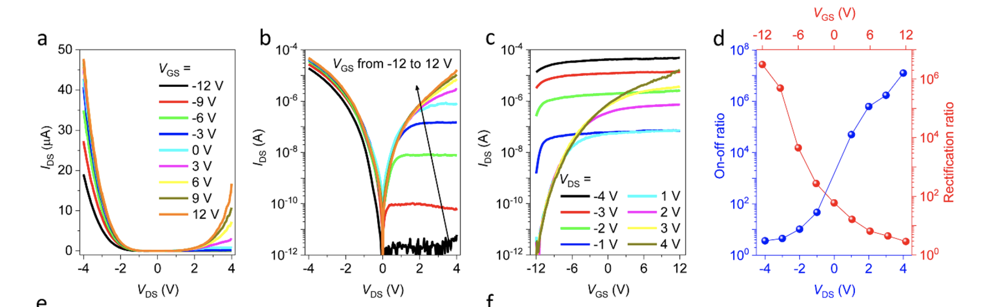

In [37]:
Image(filename = "img/h.PNG", width = 800)

* Rectification ratio approaches 3 $\cdot$ 10$^6$ @ $V_g$ = -12 V.<br/><br/>

* ON/OFF ratio approaches 2 $\cdot$ 10$^7$ @ $V_{ds}$ = 4 V.<br/><br/>

* Conductance scales _linearly_ with contact length and area of the junction.<br/><br/>

* Photocurrent mapping shows significant increase of current at the 1D barrier on the edges of the 2D/3D junction area, due to MoS$_2$ collecting photogenerated electrons and Si collecting the photogenerated holes.<br/><br/>

* Another set of results using 3D GaN checks the performance for an **isotype** junction ($n^{++}$ _-n_ ) has different performance from the **anisotype** junction ($p^{++}$ _-n_ ).<br/><br/>

* It shows similar performance as the Si-MoS$_2$ junction. The ideality factor of the GaN-MoS$_2$ diode is lower than the Si-MoS$_2$ diode as it is not as prone to oxidation soiling the interface before the deposition of the MoS$_2$.<br/><br/>.

* Good **takeaway message** below:

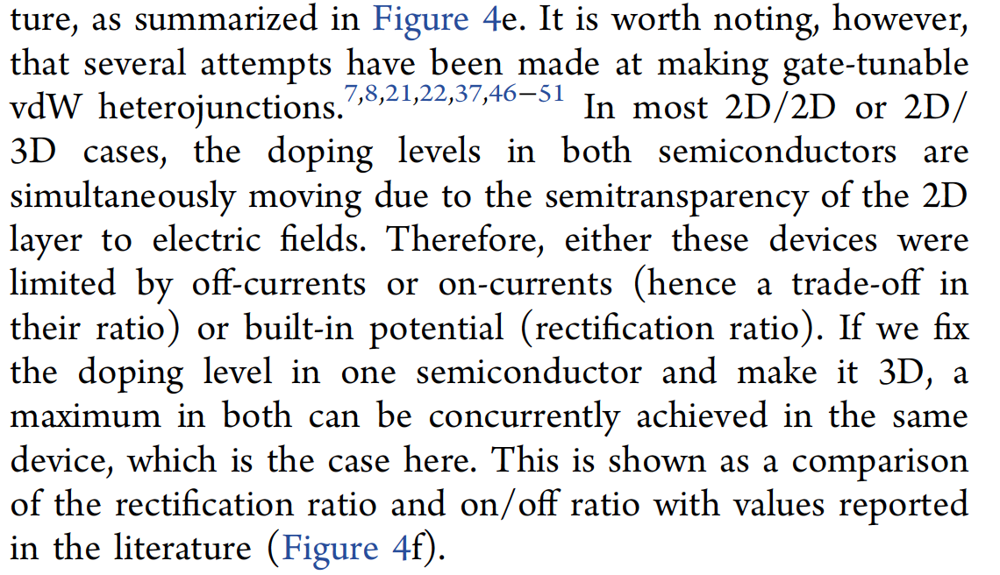

In [40]:
Image(filename = "img/i.PNG", width = 500)

`See also in ACS Nano`: [Charge Transport in MoS$_2$/WSe$_2$ van der Waals
Heterostructure with Tunable Inversion Layer](https://pubs.acs.org/doi/pdf/10.1021/acsnano.7b00021)

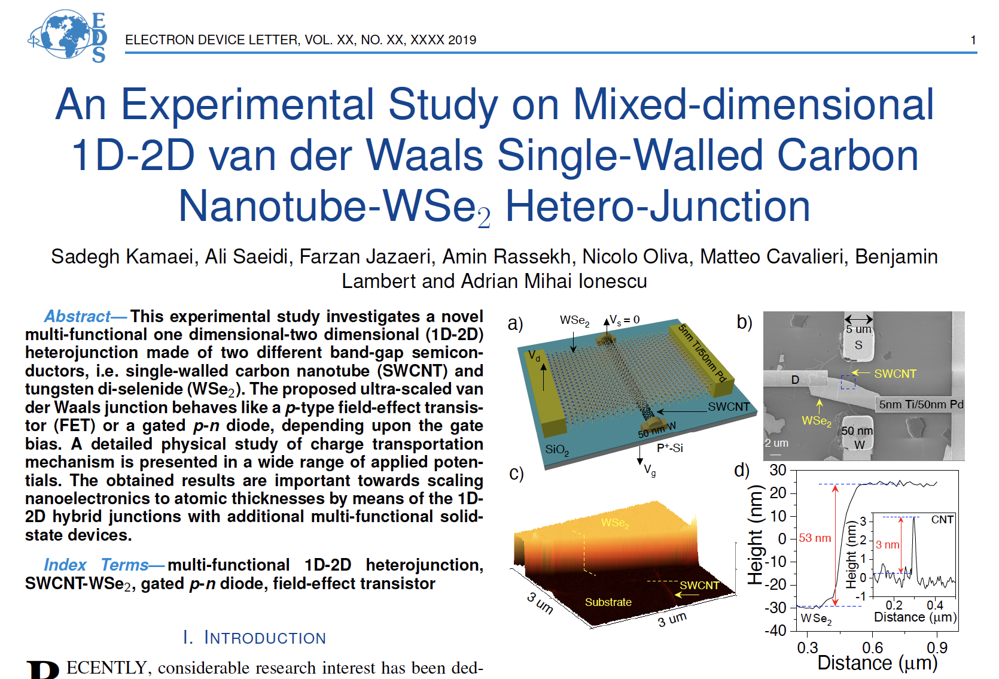

In [42]:
Image(filename = "img/j.PNG", width = 600)

* The WSe$_2$-on-top-of-CNT architecture allows for the formation of a heterjunction whose functionality can either be that of a _p_-type FET or a gated _p-n_ diode, depending on biasing scheme.<br/><br/>

* Liquid phase SWCNTs (diameter $\sim$ 3 nm) were dispersed on SiO$_2$ substrates and aligned using dielectrophoresis with tungsten guiding electrodes in order to isolate individual tubes.<br/><br/>

* WSe$_2$ flake ($\sim$ 53 nm) is then mechanically transferred onto the tube and contacted with Ti/Pd (5 nm/50 nm).<br/><br/>

* When the _p-n_ junction is in equilibrium, WSe$_2$ bands bend up towards the CNT interface.<br/><br/>

* CNT has a higher conductivity, thus transport is limited mostly by the junction itself and the resistance of the WSe$_2$ flake.<br/><br/>

* Electron transport is tunneling-dominated in the case of reverse-biased diode (positive $V_g$ and positive $V_D$).<br/><br/>

* Forward-biasing the _p-n_ junction increases the height of the Schottky barrier for holes at the Ti-WSe$_2$ contact, thus electrons primarily contribute to the current flow.<br/><br/>

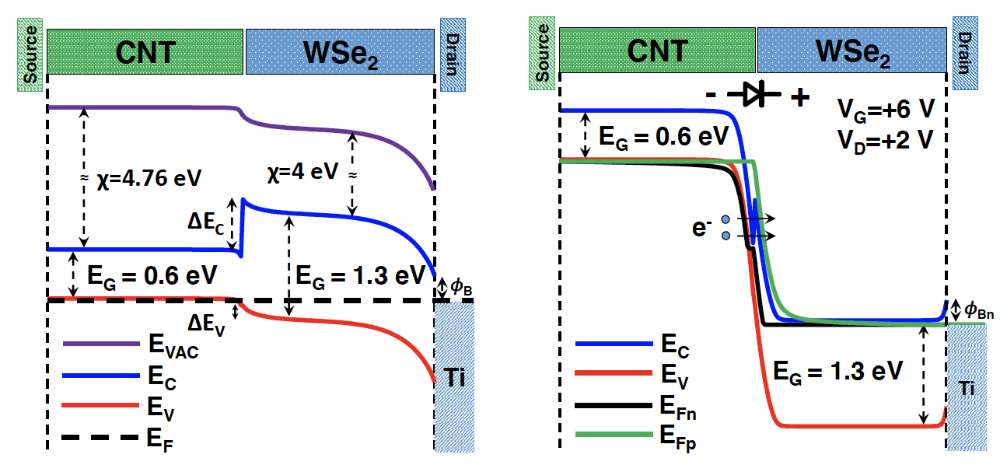

In [43]:
Image(filename = "img/k.PNG", width = 600)

* When $V_g$ is negative, the WSe$_2$ flake becomes populated with holes through the field effect, forming a _p_-channel in series with either a reverse-biased Schottky barrier ($V_D > 0$ V) or a forward-biased Schottky barrier ($V_D < 0$ V). Functional form of the transport then resembles a MOSFET.<br/><br/> 

* `Note`: in the "MOSFET" configuration, the functional form of the junction is effectively _p-p_.

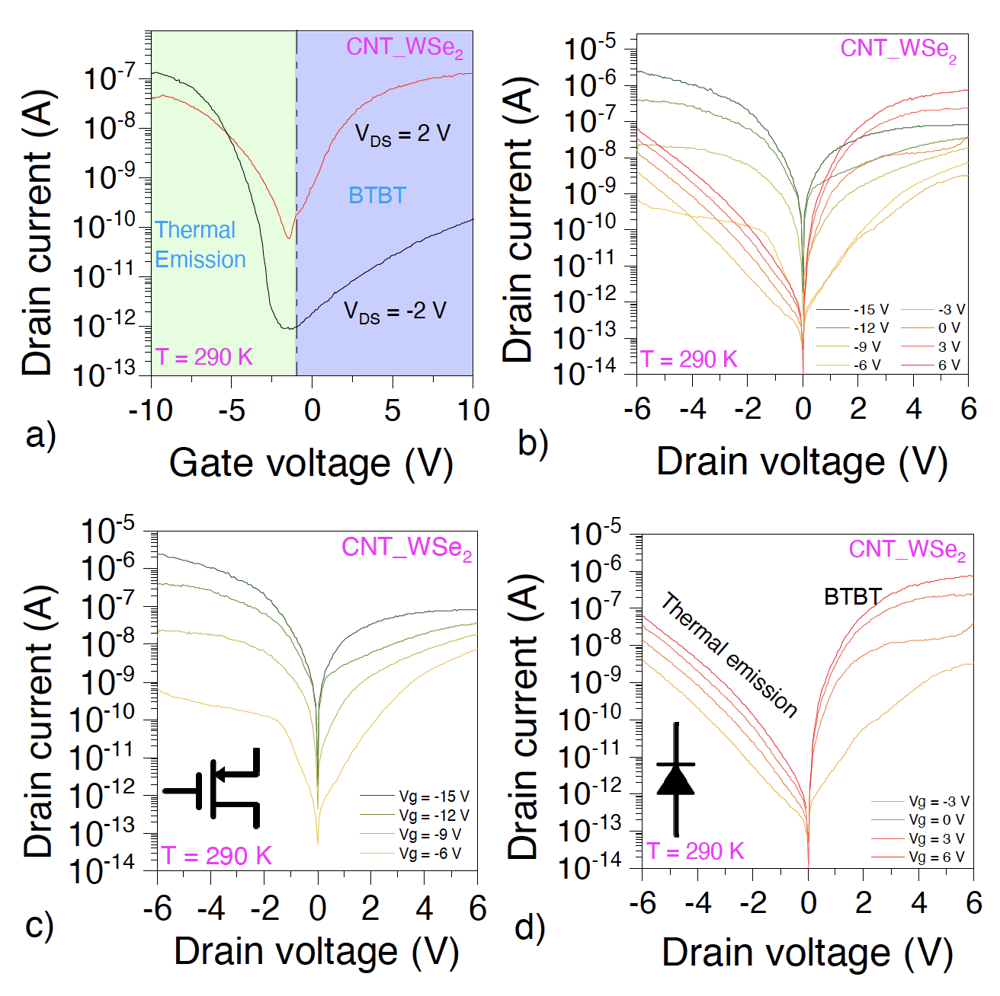

In [44]:
Image(filename = "img/l.PNG", width = 600)

* Gate-modulated output characteristics and drain-modulated transfer characteristics agree with `TCAD` predictions of junction transport behavior.<br/><br/>

* Interestingly negative $V_D$ gives higher currents due to Schottky barrier reversal on the WSe$_2$ end of the device.<br/><br/>

* Positive $V_D$ term of the current in the gated _p-n_ diode configuration remains high even when measured at 80 K as it is not from thermal contributions over the barrier but rather from band-to-band-tunneling (BTBT).<br/><br/>

* In addition, when gating through the Si substrate to induce conduction in the hole branch of the WSe$_2$, a noticeable hysteresis opens up in the transfer curves due to interfacial traps coming from the underlying oxide.



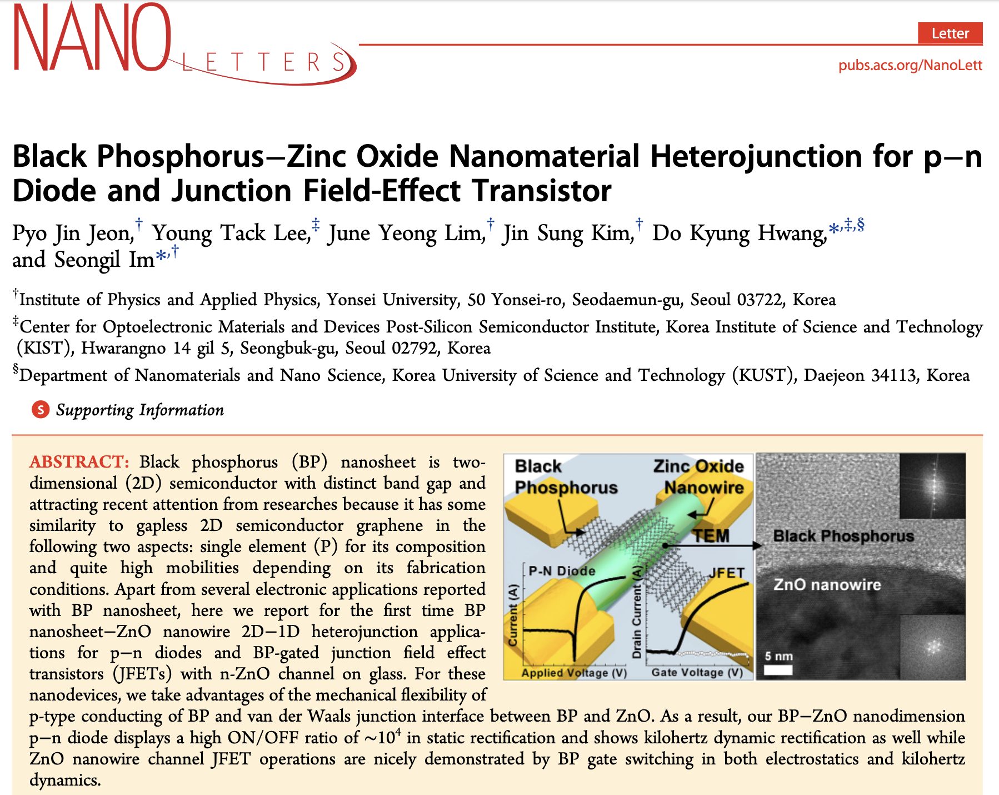

In [56]:
Image(filename = "img/r.PNG", width = 650)

* _p_-type BP flake ($t$ = 17 nm) placed on top of _n_-type ZnO nanowire ($t$ = 85 nm) is used as the JFET gate for the nanowire channel.<br/><br/>

* Assuming metallicity of the BP flake, reverse-bias _I-V_ measurements as a function of temperature allow for the extraction of an empirical Schottky barrier height at the junction using the 3D Richardson equation. This can then be used to derive the junction band diagram, seen below: <br/><br/>

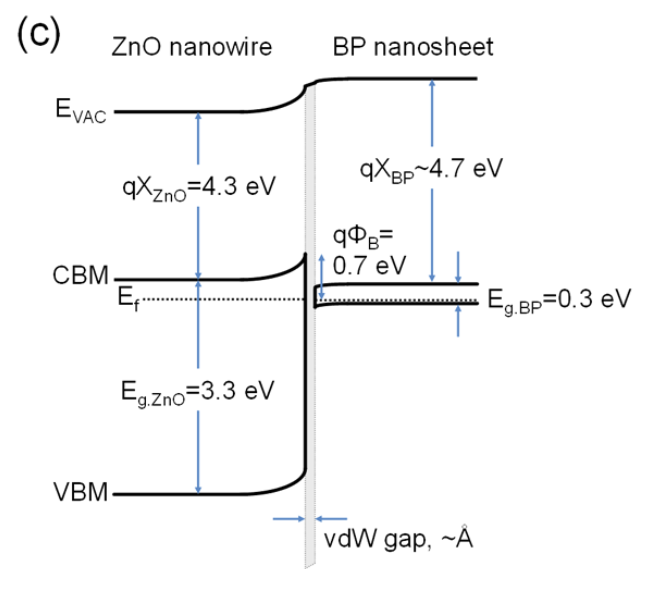

In [55]:
Image(filename = "img/s.PNG", width = 350)

* When forming a JFET, two configurations were explored. <br/><br/>

* The first, with the BP acting as the channel, proved to have no field-effect modulation of channel conductance using the ZnO nanowire as the junction gate. This was attributed to the high intrinsic hole concentration in the BP nanosheet which screened the field effect from gating in the range of operational biases.<br/><br/>

* When $V_g <$ -2 V, the forward bias across the _p-n_ junction was enough to have significant leakage currents through the gate.<br/><br/>

* The second employed the ZnO as the FET channel, with BP acting as the junction gate. This device showed good gate tunabiity, with ON/OFF ratios $\sim 10^3$ and nA gate leakage currents. <br/><br/>

* _I-V_ response shows good saturation above $V_D \approx$ 2 V. Carrier accumulation assumed to be mostly at flake/wire interface, not too deep into the wire core itself.

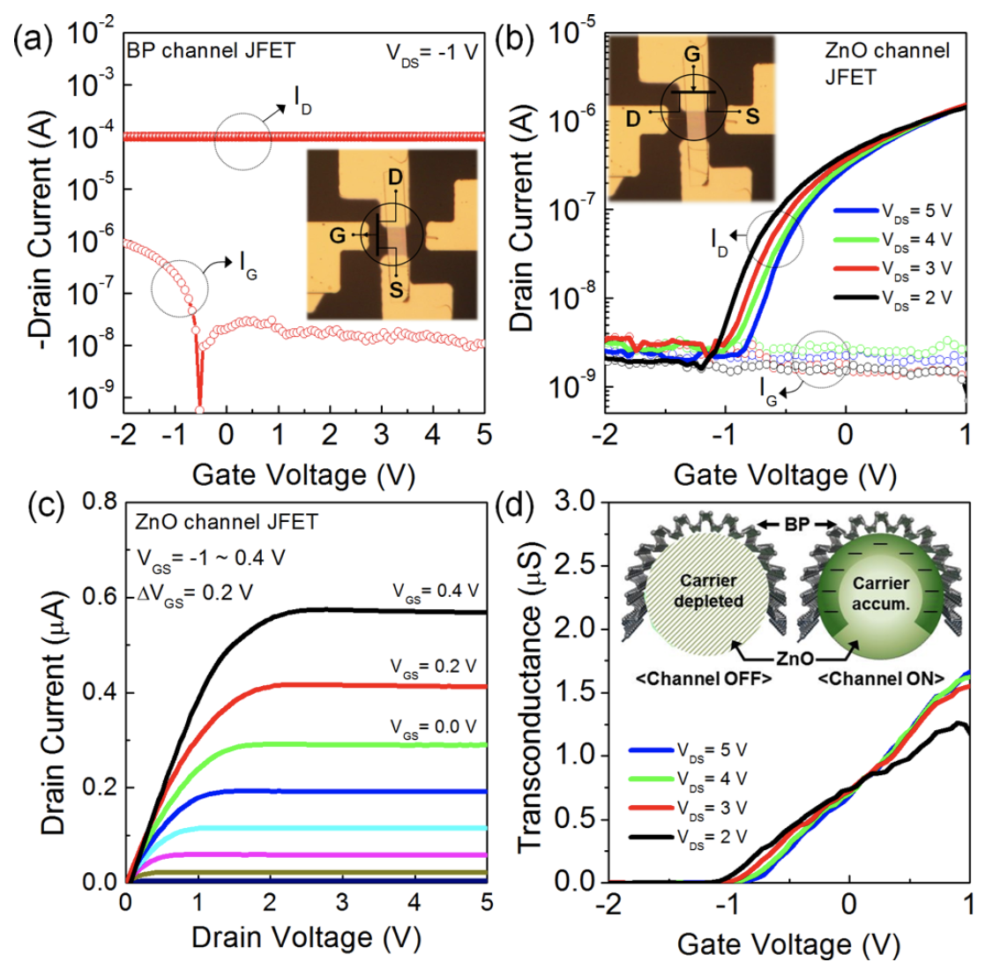

In [58]:
Image(filename = "img/t.PNG", width = 550)

* A resistive-load inverter (**common-source amplifier**) was fabricated using a 10 M$\Omega$ external resistor at the drain of the FET channel. <br/><br/>

* When wiggling the a.c. input signal at the gate of the JFET, a gain of $\sim$ 2.5 was obtained at frequencies in the kHz range with an $RC$ delay of 250 $\mu$s.

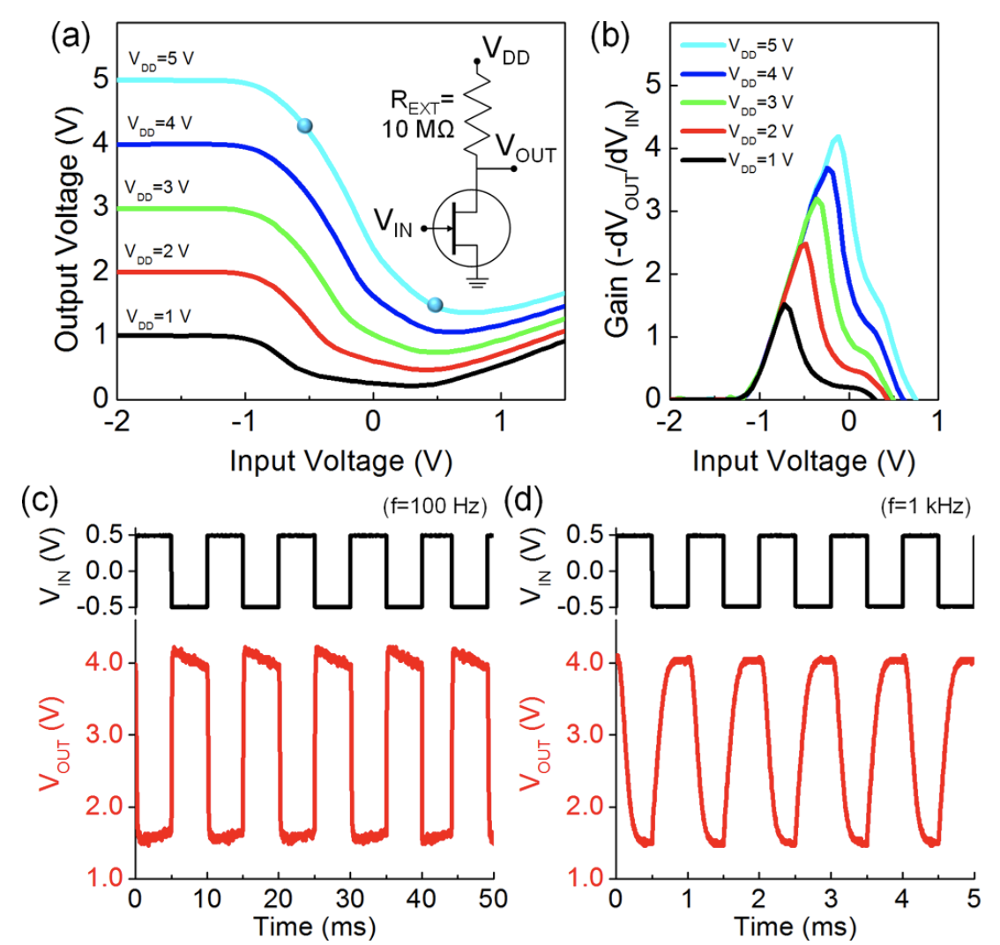

In [59]:
Image(filename = "img/u.PNG", width = 550)

* `See also in Advanced Functional Materials`: [ZnO-WSe$_2$ junction photodetector](https://onlinelibrary.wiley.com/doi/epdf/10.1002/adfm.201703822)

*********

*********

*********
******************

# <center> Nanopore-related Papers</center>

*********

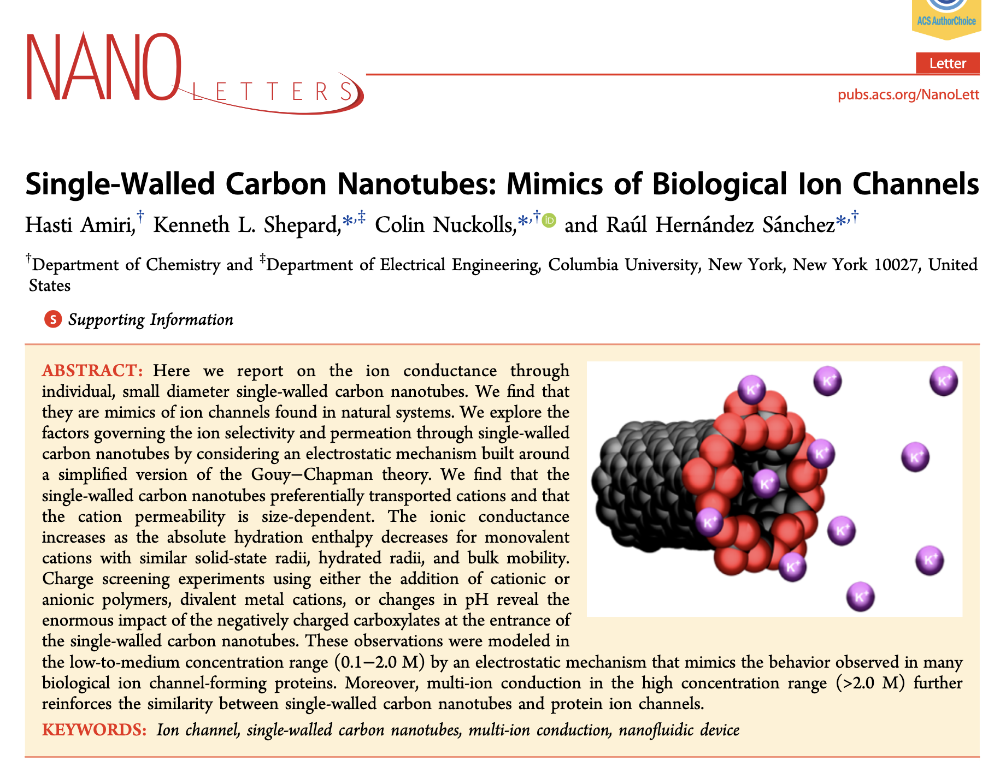

In [45]:
Image(filename = "img/m.PNG", width = 600)

* `NOTE`: SI for the above, containing useful **fabrication and characterization details** is [here](https://pubs.acs.org/doi/suppl/10.1021/acs.nanolett.6b04967/suppl_file/nl6b04967_si_001.pdf). <br/><br/>

* Advantages of using SWCNTs for ion channel mimicry: atomically precise pores with smooth walls, chemically and mechanically robust, hydrophobic core, ultra-fast rates of water transport. <br/><br/>

* Both CNTs and Ca$^{2+}$-activated K$^+$ channels have negatively charged groups at the pore opening (**carboxylate** groups in the case of O$_2$ plasma-treated CNTs); leading to selectivity of transported ions and electrostatic gating of the entering analytes.<br/><br/>

* Transport through the tubes can be modelled using simple [Guoy-Chapman](https://web.nmsu.edu/~snsm/classes/chem435/Lab14/double_layer.html) theory, _i.e._ the **diffuse electrical double layer**.<br/><br/>

* In this particular work, $L_{\mathrm{CNT}}$ = 20 $\mu$m, and $d_{\mathrm{CNT}}$ = 1.5 nm.<br/><br/>

* 10 sec O$_2$ plasma treatment at 50 W to open up the CNT channels. 30 sec O$_2$ plasma treatment at 50 W is too long and cracks the PMMA membrane (tested with leakage devices with no CNT bridge).<br/><br/>

* The small ionic radius of K doesn't seem to affect the observed ionic conductance through the CNT. However, when the larger _Group 1_ salt of Ru was studied, the ionic radius did change the observed conductance. <br/><br/>

* The method of **reversal potential** was employed, where _Reservoir 1_ was filled with a solution of constant concentration, while the concentration in the _Reservoir 2_ was varied. The voltage necessary to halt ionic current completely between the two reservoirs is the **reversal potential**.<br/><br/>

* A positive reversal potential on the more dilute side is consistent with ionic current being carried by cations.<br/><br/>

* The CNT shows a strong permittivity ratio for cations over anions, $\frac{P_C}{P_A} \approx 121 \pm 5$, for KCl, as derived from [Goldman theory](https://en.wikipedia.org/wiki/Goldman_equation).<br/><br/>

* Importantly, it is not simply the ionic radius/charge that governs the K$^+$-preferrential transport, but the **hydration enthalpy** ($\Delta H^{\circ}_{\mathrm{hydration}}$) of the cation. When compared with ions of similar ionic/hydrated radii and bulk mobility (Tl$^+$ and NH$^{+}_{4}$), the ions fan out conductance **indirectly with increasing** $\Delta H^{\circ}_{\mathrm{hydration}}$, _i.e._ ions which are more loosely bound with water pay a lesser penalty on propagating through the hydrophobic CNT core.<br/><br/>

* `Note`: $\Delta H^{\circ}_{\mathrm{hydration}}$ is the energy released when attractions are set up between ions and water molecules, _i.e._ they are **negative** quantities. <br/><br/>

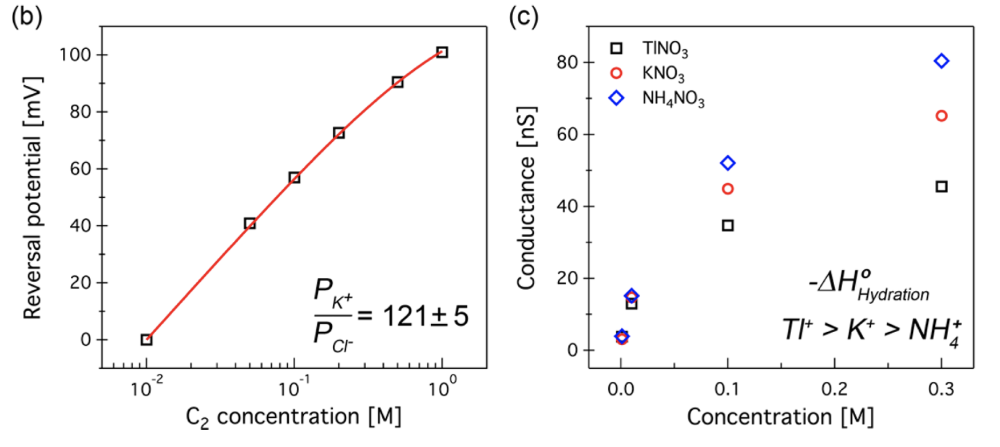

In [47]:
Image(filename = "img/n.PNG", width = 600)

* When the ratio of the two reservoir concentrations is kept constant (at 2:1), but the concentration of the more dilute reservoir is brought to below 1 mM, the effects of so-called static **Donnan potentials** can be recognized when the electrolyte concentration is low enough that screening is not sigificant. <br/><br/>

* Cationic and anionic polymers were used to coat the entrance of the tube and screen the fixed charges responsible for the entrance Donnan potentials. This in turn reduces the absolute reversal potential across the tube, proving that the chemistry of the pore mouth is responsible for the dynamics of the ionic transport.<br/><br/>

* Ionic conductance is seen to drop rapidly with decreasing pH, suggesting that the protonation of the carboxyl groups at the tube entrance and its dielectric environment is the governing factor for ionic current modulation.<br/><br/>

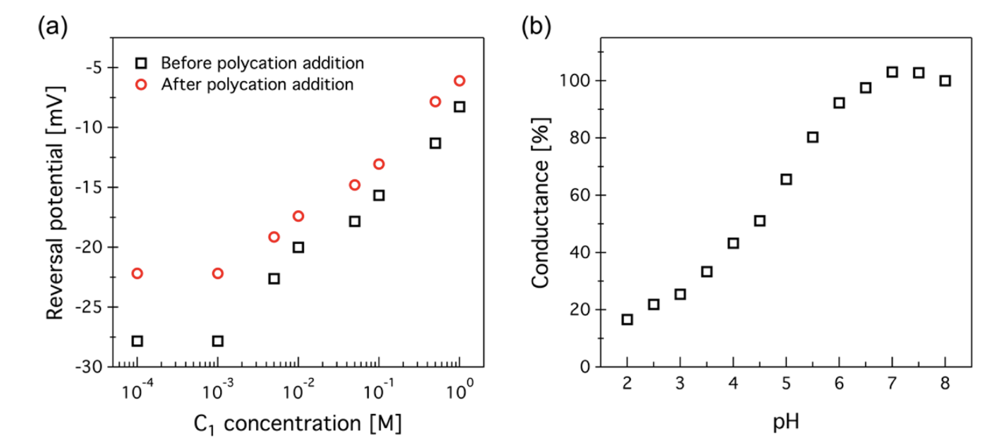

In [48]:
Image(filename = "img/o.PNG", width = 600)

* In the symmetric KCl solution set-up, the ionic conductance ($G$) was found to scale closely as the square root of the ionic concentration, _i.e._ $\large G \propto \sqrt{C}$, just like in biological pores; though other works on CNTs have found results closer to $\large G \propto C^{0.4}$.<br/><br/>

* Importantly, divalent ions were shown to not have the ability to modulate the ionic conductance with concentration, in fact showing an inverted trend from K$^+$ due to increased screening effects of the surface charge at the pore mouth.<br/><br/>

* From Guoy-Chapman theory, the conductance of the channel is determined by the local concentration of permeant ions at the pore entrance.<br/><br/>

* The surface potential associated with the attractor point charge at the channel mouth is given by: $\Phi = \Large \frac{q}{4 \pi \varepsilon_0 \varepsilon_r} \cdot e^{\frac{-r}{\lambda_D}}$, where $\lambda_D$ is the Debye length and $\varepsilon_r$ is the dielectric constant of water. <br/><br/>

* Just as in biological `CaK` channels, the CNTs were found to saturate ionic conductance at concentrations above 2 M, due to effects related to ion queueing and the freeing of vacancies available for ionic transport in the channel.<br/><br/>

* This single-file ion transport, also observed in biological pores, is indicative of the entry rate exceeding the internal transport rate. Species with lower ionic mobilities will thus see a conductance peak at lower ionic concentrations, which is the case here where curves fan out for Li$^+$, Na$^+$ and K$^+$:

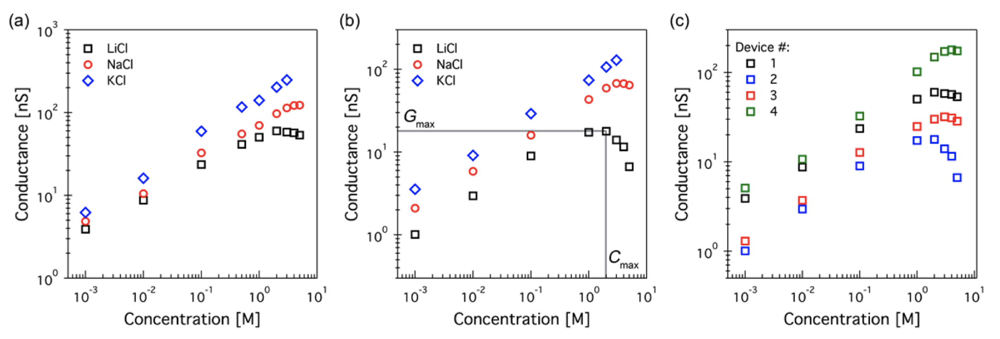

In [51]:
Image(filename = "img/p.PNG", width = 850)

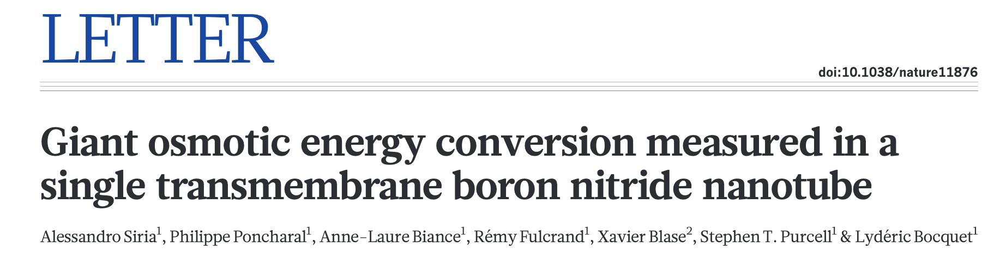

In [60]:
Image(filename = "img/v.PNG", width = 850)

* BNNTs used for nanofluidic experiments here $R$ = 15–40 nm, $L$ = 1 $\mu$m.<br/><br/>

* Tube ionic conductivity: $\large K = \frac{I L}{V} \cdot \frac{1}{\pi R^2}$.<br/><br/>

* The conductance saturates at low ionic concentrations due to the charge-confining surface of the dielectric BNNT. The predicted ionic conductance is thus:<br/> $\large G = 2 e^2 \mu C_s \frac{\pi R^2}{L} + e \mu \frac{2 \pi R}{L} \left | \Sigma \right | (1 + \alpha)$,<br/> where $\large \alpha = \frac{1}{2 \pi \lambda_B \mu \eta} \approx 1$, with $\eta$ being the viscosity of water and $\lambda_B$ = 0.7 nm being the [Bjerrum length](https://en.wikipedia.org/wiki/Bjerrum_length). <br/><br/>

* At $pH$ = 11, the BNNT surface charge: $\Sigma$ = 9 e/nm$^2$ (v. high).<br/><br/>

* In the _I-V_ response, typical ionic currents are of the order of nA at sub-1V biases.

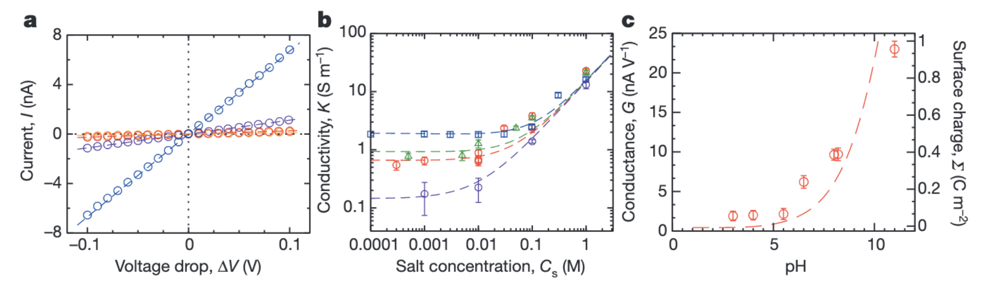

In [61]:
Image(filename = "img/w.PNG", width = 850)

* The osmotic current is usually defined as: <br/>$I_{\mathrm{osm}} = K_{\mathrm{osm}} \Delta \mathrm{log}(C_s)$ where $\large C_s = \frac{C_{s1}}{C_{s2}}$.<br/><br/>

* Authors derive their own version for BNNTs which also incorporates diffusion terms and results in:<br/>$\large I_{\mathrm{osm}} \approx \frac{2 \pi R \Sigma}{L} \frac{k_B T}{\eta \lambda_B} \Delta \mathrm{log}(C_s)$ <br/><br/>

* The huge osmotic currents recorded through the BNNT (higher even than due to applied pressure between reservoirs) are attributed to the massive surface charge of the BNNTs.<br/><br/>

* The osmotic power generated by the tube is given by : $\large P_{\mathrm{max}} = \frac{I^{2}_{\mathrm{osm}}}{4 G_{\mathrm{ionic}}} = \frac{K^{2}_{\mathrm{osm}}}{4 G_{\mathrm{ionic}} \left [ \Delta \mathrm{log}(C_s) \right ]^2}$

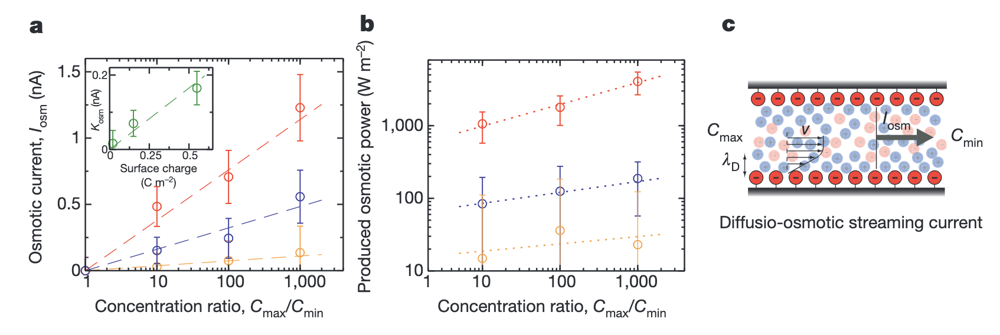

In [62]:
Image(filename = "img/x.PNG", width = 850)

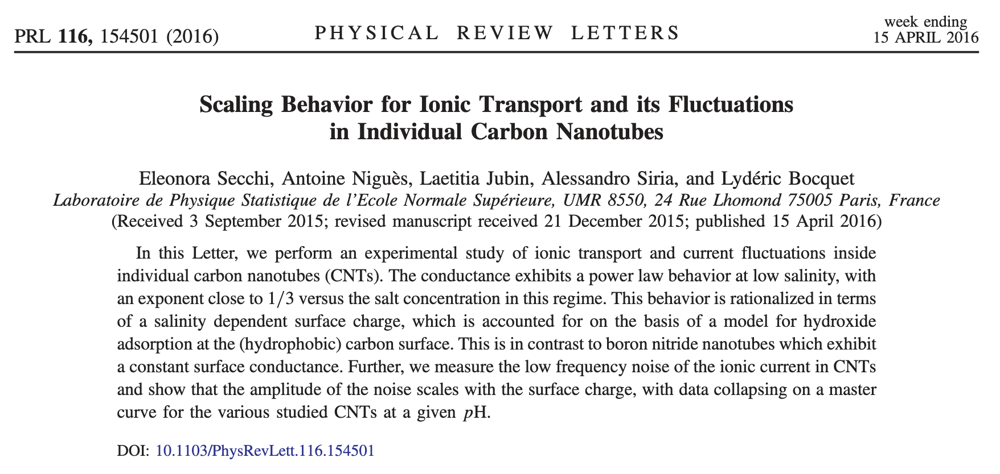

In [65]:
Image(filename = "img/y.PNG", width = 750)

* Ionic conductance scales as $\large G \propto C^{\alpha}$, where $\alpha$ = 1/3 for CNTs. `Note:` This is different from the Columbia CNT findings...<br/><br/>

* The measurement set up as Ag/AgCl electrodes connected to an external voltage-clamp amplifier. Measurement resolution here is 10 pA at 5 kHz. <br/><br/>

* A range of CNT geometeries was tested, with $R$ = 3.5–35 nm and $L$ = 500–3000 nm.<br/><br/>

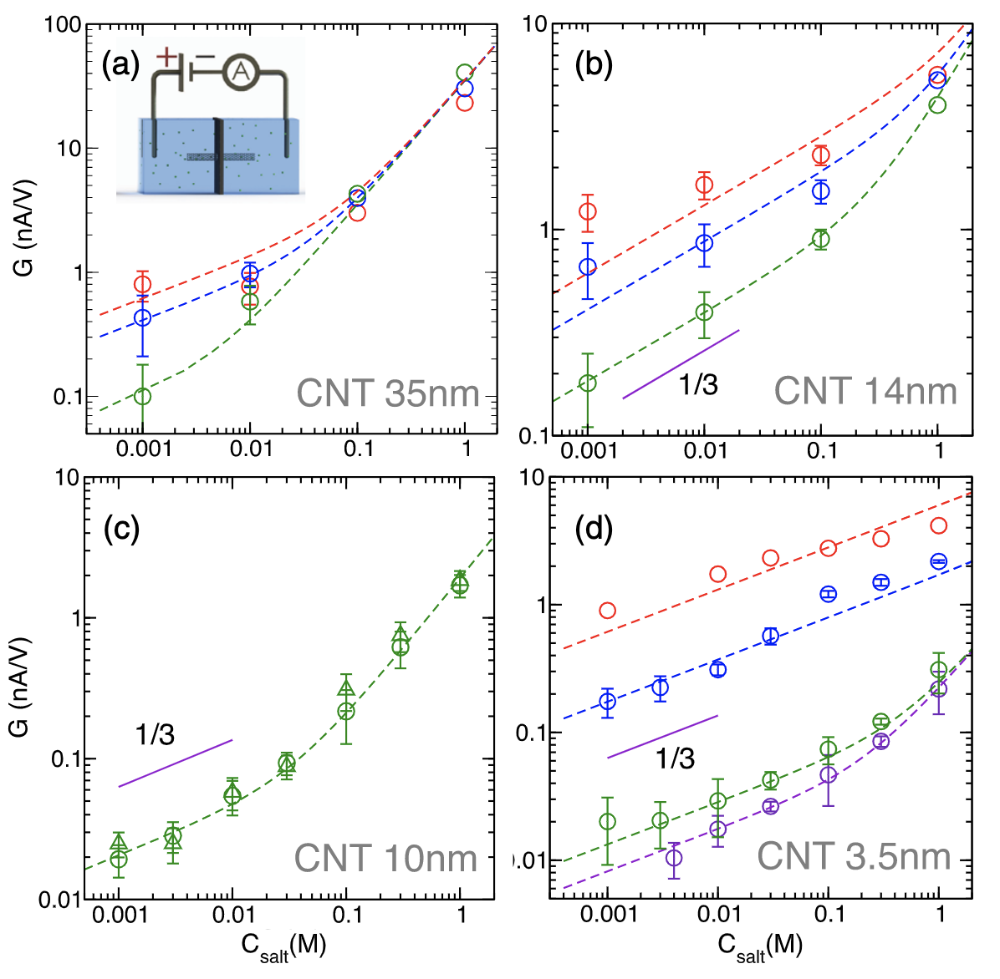

In [67]:
Image(filename = "img/z.PNG", width = 450)

* The surface charge on the CNT is modelled as:<br/> $\large \left | \Sigma \right | \approx \left ( \frac{k_A}{2 \pi l_B} \rho_s \right)^{1/3}$ where $l_B$ is the Bjerrum length, $k_A$ contains the dissociation constant of water and surface adsorption terms and $\rho_s$ is the salt number density. <br/><br/>

* The $\frac{1}{3}$ scaling of the surface charge is proposed to be the root cause of the same scaling observed in the ionic conductance through the CNT.<br/><br/>

* Here, the proposed ionic conductance model through the CNT is:<br/> $\large G = 2 e^2 \mu \frac{\pi R^2}{L} \sqrt{\rho^{2}_{s} + \frac{\Sigma^2}{R^2}}$. <br/><br/>

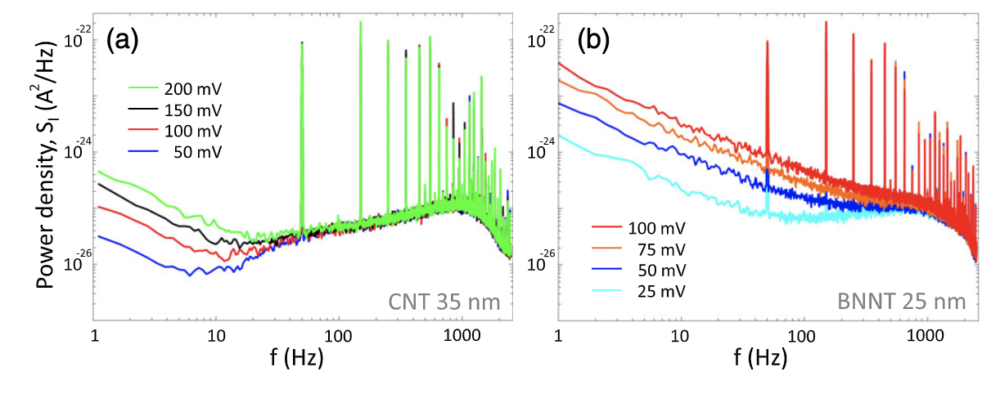

In [69]:
Image(filename = "img/aa.PNG", width = 650)

* Flicker noise tested through both CNTs and BNNTs. Its amplitude is seen to increase with the applied $V_{ds}$ and with the mean current squared ($I^2$).<br/><br/>

* Interestingly, in contrast to the CNT, the noise amplitude in the BNNT is insensitive to salt concentration whatever the pH.<br/><br/>

* $1/f$ noise collapses onto a master curve regardless of CNT diameter, indirectly proving that its origin is in the fluctuation of the surface charge.<br/><br/>

* This surface charge fluctuation is a function of the differential capacitance of the interface, which after some derivations results in a **linear scaling of the noise amplitude with the surface charge for CNTs**:<br/><br/> $\large A_H = \alpha \bar{I}^2 \propto \frac{e \left | \Sigma \right |}{G^2} \times  \bar{I}^2$

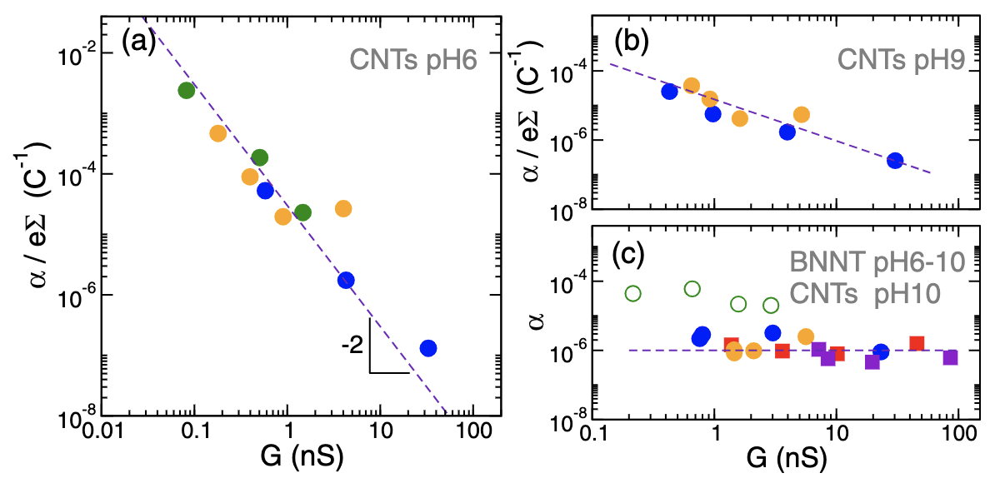

In [70]:
Image(filename = "img/bb.PNG", width = 650)

* For BNNTs, the ionic conductance is instead constant, suggesting that the OH$^{-}$ adsorption on the surface does not affect the conductance in the tube as much as in the case of CNTs.